## Imports & inital settings

In [1]:
import torch
import numpy as np
import random
import wandb
from IPython.display import Markdown
from utils.preprocessing import preprocess_data, CustomDataset, collate_fn, BATCH_SIZE

DF_PATH = "merged_annuale_meteo.csv"
ISDAY_PATH = "sunriseset.csv"
SEED = 46209

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

## Dataset Preprocessing

In [2]:
processed_data = preprocess_data(DF_PATH, ISDAY_PATH)

In [3]:
df = processed_data["df"].copy()
media_prod_giornaliera = processed_data['media']

In [4]:
display(Markdown(f"### Media Produzione Giornaliera: _{round(media_prod_giornaliera, 2)} kW/h_"))

### Media Produzione Giornaliera: _2969.08 kW/h_

## Model Setup

In [5]:
from utils.nnmodel import ModelManager

In [6]:
run = wandb.init(
    project="interpolation",
    name="Giga Recurrent Random Unbounded Network (15 Min) ➿",
    config={
        "learning_rate": 0.001,
        "architecture": "GRRUNH",
        "dataset": "RofiloAnnuale-FullCyclingEncoding",
        "epochs": 100,
        "batch_size": BATCH_SIZE, #10
        "window_size": 1,
        "target_size": 1,
        "seed": SEED,
    },
    notes="Train con Dataset Originale. No BUCHI TotalEnergy, NUOVO MODO DI DIVIDERE IL CODICE",
)

wandb: Currently logged in as: nicolo-vescera (rofilopd). Use `wandb login --relogin` to force relogin


In [7]:
mm = ModelManager(run, name="GRRUN15MIN")

Using cuda device
NeuralNetwork(
  (input_before): GRU(48, 32, batch_first=True)
  (input_after): GRU(48, 32, batch_first=True)
  (flat): Flatten(start_dim=1, end_dim=-1)
  (linear1_2): Linear(in_features=64, out_features=128, bias=True)
  (linear2_2): Linear(in_features=128, out_features=128, bias=True)
  (loopGru): GRU(18, 128, batch_first=True)
  (output_layer): Linear(in_features=128, out_features=1, bias=True)
)
Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0
)


## Training

In [8]:
train_df, val_df, test_df, train_scaler, train_target_scaler = processed_data['datasets']['original'].copy()

  0%|          | 0/100 [00:00<?, ?epoch/s]

Epoch 01/100 | Train Loss 0.078 | Val Loss 0.073
	Saving model (improve loss) 1000000.0 -> 0.0729358121752739
Epoch 02/100 | Train Loss 0.042 | Val Loss 0.056
	Saving model (improve loss) 0.0729358121752739 -> 0.05602225288748741
Epoch 03/100 | Train Loss 0.048 | Val Loss 0.042
	Saving model (improve loss) 0.05602225288748741 -> 0.04233571141958237
Epoch 04/100 | Train Loss 0.035 | Val Loss 0.042
	Saving model (improve loss) 0.04233571141958237 -> 0.04210455343127251
Epoch 05/100 | Train Loss 0.036 | Val Loss 0.039
	Saving model (improve loss) 0.04210455343127251 -> 0.039119429886341095
Epoch 06/100 | Train Loss 0.028 | Val Loss 0.038
	Saving model (improve loss) 0.039119429886341095 -> 0.03781237453222275
Epoch 07/100 | Train Loss 0.034 | Val Loss 0.037
	Saving model (improve loss) 0.03781237453222275 -> 0.037199966609478
Epoch 08/100 | Train Loss 0.033 | Val Loss 0.036
	Saving model (improve loss) 0.037199966609478 -> 0.036348115652799606
Epoch 09/100 | Train Loss 0.028 | Val Loss 0.

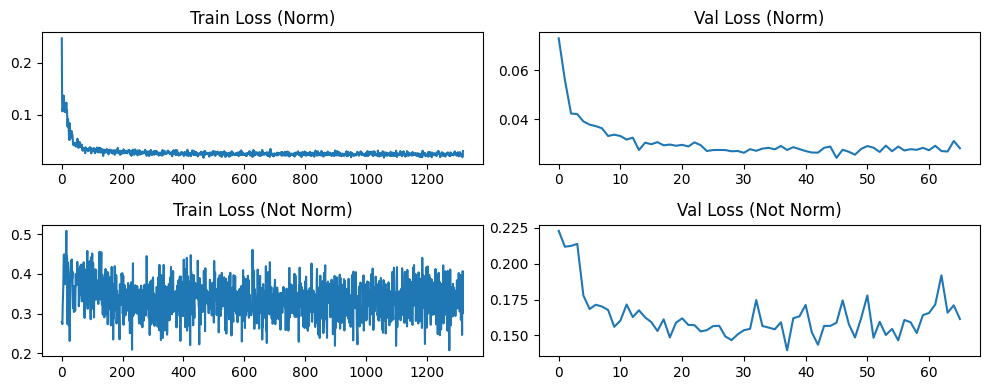

In [9]:
mm.train(train_df, val_df)

## Evaluation

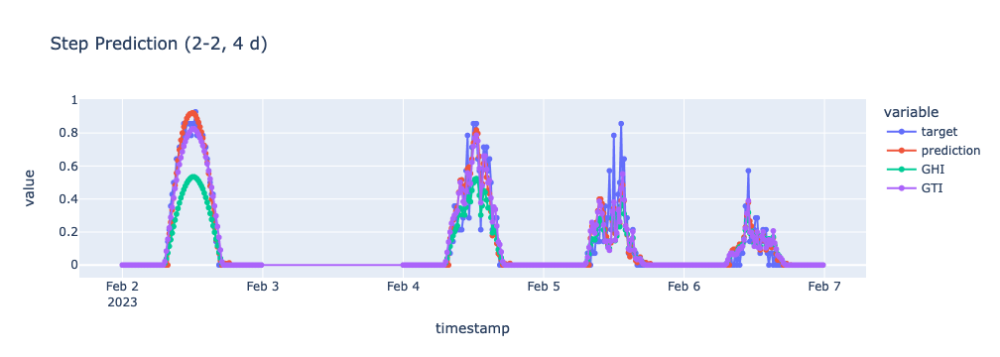

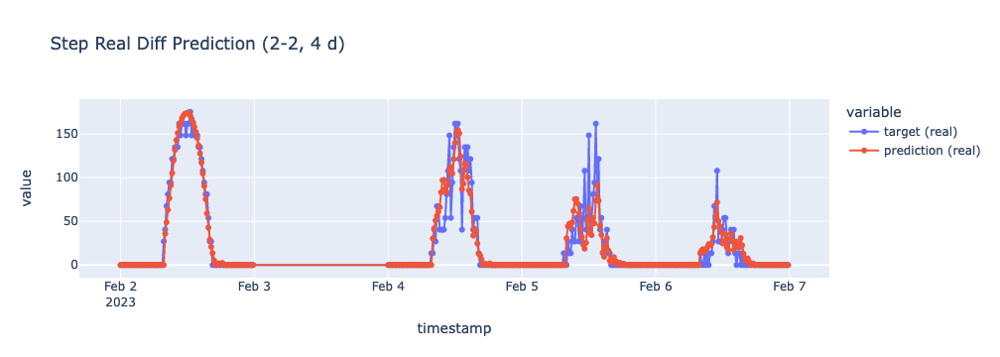

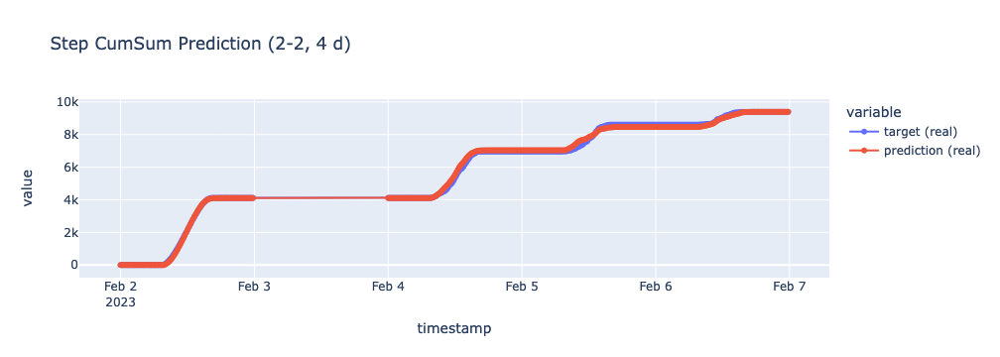

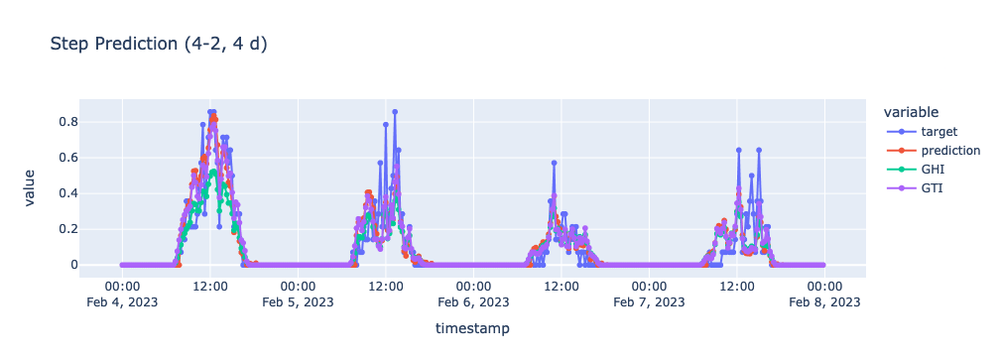

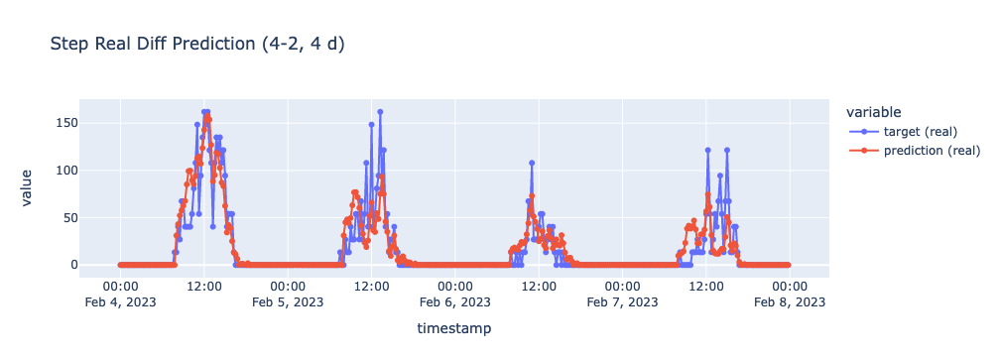

...

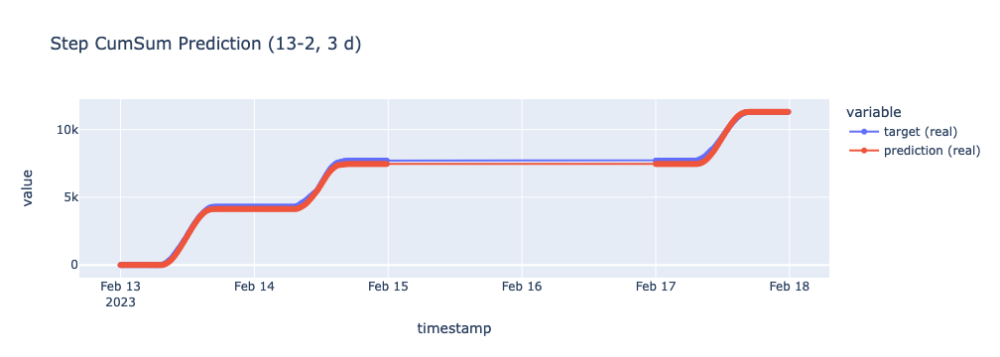

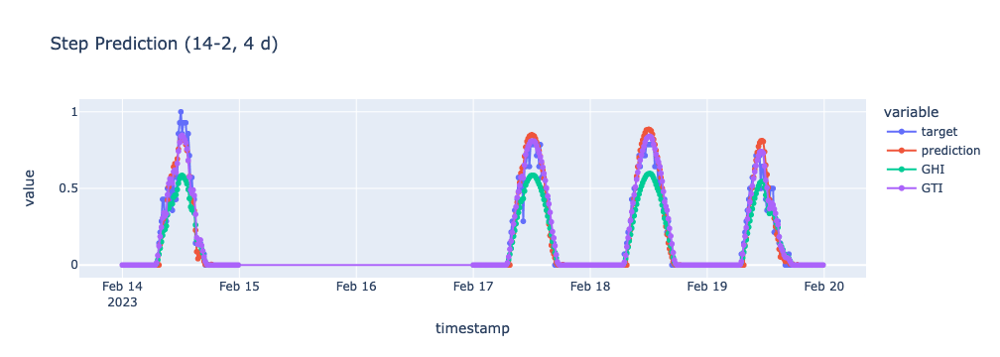

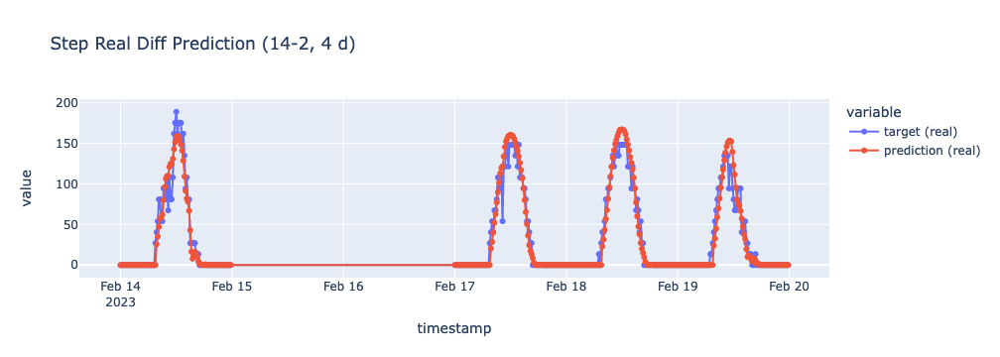

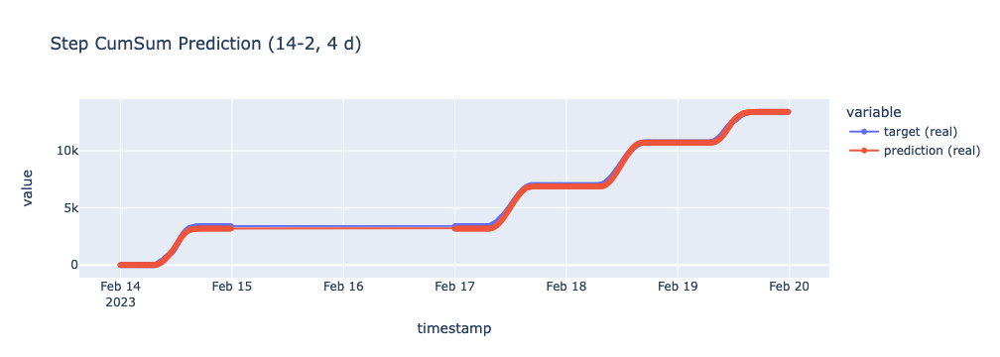

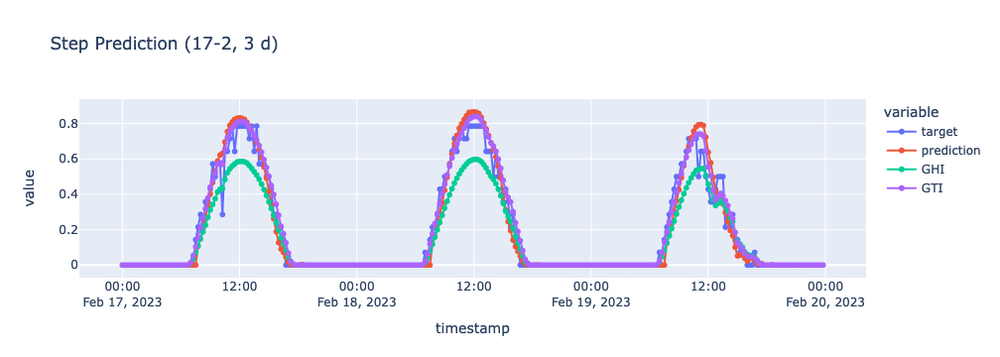

In [9]:
mm.evaluate(test_df, train_target_scaler, model_path="./models/GRRUN15MIN_b10_e100.model")